In [4]:
import plotly.graph_objs as go
import plotly.io as pio
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as pyo
from plotly.figure_factory import create_table
from wordcloud import WordCloud
from textwrap import wrap
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import seaborn as sns

pyo.init_notebook_mode()
pio.renderers.default = "notebook_connected"

In [5]:
covid_data = pd.read_csv('covid.csv').fillna(0)
covid_grouped_data = pd.read_csv('covid_grouped.csv').fillna(0)
covid_death_data = pd.read_csv('coviddeath.csv').fillna(0)

In [6]:
covid_data.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,0.0,162804.0,0.0,2576668.0,0.0,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,0.0,98644.0,0.0,2047660.0,0.0,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,0.0,41638.0,0.0,1377384.0,0.0,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,0.0,14606.0,0.0,676357.0,0.0,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,0.0,9604.0,0.0,387316.0,0.0,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [7]:
print(covid_data.shape)
print(covid_data.size)

(209, 17)
3553


In [8]:
covid_grouped_data.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [9]:
print(covid_grouped_data.shape)
print(covid_grouped_data.size)

(35156, 11)
386716


In [10]:
covid_death_data.head()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,0
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,0
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,0
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,0
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,0


In [11]:
print(covid_death_data.shape)
print(covid_death_data.size)

(12260, 10)
122600


In [12]:
covid_data.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases', 'NewCases',
       'TotalDeaths', 'NewDeaths', 'TotalRecovered', 'NewRecovered',
       'ActiveCases', 'Serious,Critical', 'Tot Cases/1M pop', 'Deaths/1M pop',
       'TotalTests', 'Tests/1M pop', 'WHO Region', 'iso_alpha'],
      dtype='object')

In [13]:
covid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country/Region    209 non-null    object 
 1   Continent         209 non-null    object 
 2   Population        209 non-null    float64
 3   TotalCases        209 non-null    int64  
 4   NewCases          209 non-null    float64
 5   TotalDeaths       209 non-null    float64
 6   NewDeaths         209 non-null    float64
 7   TotalRecovered    209 non-null    float64
 8   NewRecovered      209 non-null    float64
 9   ActiveCases       209 non-null    float64
 10  Serious,Critical  209 non-null    float64
 11  Tot Cases/1M pop  209 non-null    float64
 12  Deaths/1M pop     209 non-null    float64
 13  TotalTests        209 non-null    float64
 14  Tests/1M pop      209 non-null    float64
 15  WHO Region        209 non-null    object 
 16  iso_alpha         209 non-null    object 
dt

In [14]:
covid_data.drop(['NewCases', 'NewDeaths', 'NewRecovered'], axis=1, inplace=True)
covid_data.head()

,Country/Region,Continent,Population,TotalCases,TotalDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,162804.0,2576668.0,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,98644.0,2047660.0,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,41638.0,1377384.0,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,14606.0,676357.0,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,9604.0,387316.0,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [15]:
# Create a table using plotly
pyo.iplot(create_table(covid_data.head(10), colorscale = [[0, '#4d004c'], [0.5, '#f2e5ff'], [1, '#ffffff']]))

## Comparisons between COVID infected countries in terms of total cases, total deaths, total recovered, & total tests

In [16]:
px.bar(covid_data.head(10), x = 'Country/Region', y = 'TotalCases', title = 'Total Cases of COVID-19 in top 10 countries', 
       text = 'TotalCases', height = 400, color = 'TotalCases', hover_data = ['Country/Region', 'TotalCases'])

In [17]:
px.bar(covid_data.head(10), x = 'Country/Region', y = 'TotalCases', title = 'Total Cases of COVID-19 in top 10 countries', 
       text = 'TotalCases', height = 400, color = 'TotalDeaths', hover_data = ['Country/Region', 'TotalCases'])

In [18]:
px.bar(covid_data.head(10), x = 'Country/Region', y = 'TotalCases', title = 'Total Cases of COVID-19 in top 10 countries', 
       text = 'TotalCases', height = 400, color = 'TotalRecovered', hover_data = ['Country/Region', 'TotalCases'])

In [19]:
px.bar(covid_data.head(10), x = 'Country/Region', y = 'TotalCases', title = 'Total Cases of COVID-19 in top 10 countries', 
       text = 'TotalCases', height = 400, color = 'TotalTests', hover_data = ['Country/Region', 'TotalCases'])

In [20]:
px.bar(covid_data.head(10), x = 'Country/Region', y='TotalCases', title='Total Cases of COVID-19 in top 10 countries',
         text = 'TotalCases', height = 400, color = 'Serious,Critical', hover_data = ['Country/Region', 'TotalCases'])

In [21]:
px.bar(covid_data.head(10), x = 'TotalCases', y = 'Country/Region', title = 'Total Cases of COVID-19 in top 10 countries',
         text = 'TotalCases', height = 400, color = 'Serious,Critical', orientation = 'h', hover_data = ['Country/Region', 'TotalCases'])

In [22]:
px.bar(covid_data.head(10), x = 'TotalCases', y = 'Continent', title = 'Top 10 Total Cases of COVID-19 Across Different Continents',
         text = 'TotalCases', height = 400, color = 'Serious,Critical', orientation = 'h', hover_data = ['Country/Region', 'Continent', 'TotalCases'])

In [23]:
px.bar(covid_data.head(10), x = 'TotalDeaths', y = 'Country/Region', title = 'Total Deaths of COVID-19 in top 10 countries',
         text = 'TotalDeaths', height = 400, color = 'TotalCases', orientation = 'h', hover_data = ['Country/Region', 'TotalDeaths'])

In [24]:
px.bar(covid_data.head(10), x = 'TotalDeaths', y = 'Continent', title = 'Top 10 Total Deaths of COVID-19 Across Different Continents',
         text = 'TotalDeaths', height = 400, color = 'TotalCases', orientation = 'h', hover_data = ['Country/Region', 'Continent', 'TotalDeaths'])

In [25]:
px.bar(covid_data.head(10), x = 'TotalRecovered', y = 'Country/Region', title = 'Total Recovered Cases of COVID-19 in top 10 countries',
            text = 'TotalRecovered', height = 400, color = 'TotalCases', orientation = 'h', hover_data = ['Country/Region', 'TotalRecovered'])

In [26]:
px.bar(covid_data.head(10), x = 'TotalRecovered', y = 'Continent', title = 'Top 10 Total Recovered of COVID-19 Across Different Continents',
         text = 'TotalRecovered', height = 400, color = 'TotalCases', orientation = 'h', hover_data = ['Country/Region', 'Continent', 'TotalRecovered'])

In [27]:
px.bar(covid_data.head(10), x = 'TotalTests', y = 'Country/Region', title = 'Total Tests of COVID-19 in top 10 countries',
            text = 'TotalTests', height = 400, color = 'TotalCases', orientation = 'h', hover_data = ['Country/Region', 'TotalTests'])

In [28]:
px.bar(covid_data.head(10), x = 'TotalTests', y = 'Continent', title = 'Top 10 Total Tests of COVID-19 Across Different Continents',
         text = 'TotalTests', height = 400, color = 'TotalCases', orientation = 'h', hover_data = ['Country/Region', 'Continent', 'TotalTests'])

In [29]:
px.scatter_geo(covid_data, locations = 'Country/Region', locationmode = 'country names', color = 'TotalCases',
                hover_name = 'Country/Region', size = 'TotalCases', projection = 'natural earth', title = 'Total Cases of COVID-19 in different countries', hover_data = ['Continent', 'Serious,Critical', 'TotalDeaths', 'TotalRecovered', 'TotalTests'])

## Comparisons between COVID infected countries in terms of confirmed cases, deaths, and recovered cases in USA

In [30]:
data_USA = covid_grouped_data.loc[covid_grouped_data['Country/Region'] == 'US']
pyo.iplot(create_table(data_USA, colorscale = [[0, '#4d004c'], [0.5, '#f2e5ff'], [1, '#ffffff']]))

In [31]:
px.bar(data_USA, x = 'Date', y = 'Confirmed', title = 'Confirmed Cases of COVID-19 in USA', 
       text = 'Confirmed', height = 400, color = 'Confirmed', hover_data = ['Date', 'Confirmed'])

In [32]:
px.line(data_USA, x = 'Date', y = 'Confirmed', title = 'Confirmed Cases of COVID-19 in USA', 
        height = 400, hover_data = ['Date', 'Confirmed'])

In [33]:
px.bar(data_USA, x = 'Date', y = 'Recovered', title = 'Recovered Cases of COVID-19 in USA', 
       text = 'Recovered', height = 400, color = 'Recovered', hover_data = ['Date', 'Recovered'])

In [34]:
px.line(data_USA, x = 'Date', y = 'Recovered', title = 'Recovered Cases of COVID-19 in USA', 
        height = 400, hover_data = ['Date', 'Recovered'])

In [35]:
px.bar(data_USA, x = 'Date', y = 'Deaths', title = 'Deaths of COVID-19 in USA', 
       text = 'Deaths', height = 400, color = 'Deaths', hover_data = ['Date', 'Deaths'])

In [36]:
px.line(data_USA, x = 'Date', y = 'Deaths', title = 'Deaths of COVID-19 in USA', 
        height = 400, hover_data = ['Date', 'Deaths'])

In [37]:
px.bar(data_USA, x = 'Date', y = 'Active', title = 'Active Cases of COVID-19 in USA', 
       text = 'Active', height = 400, color = 'Active', hover_data = ['Date', 'Active'])

In [38]:
px.line(data_USA, x = 'Date', y = 'Active', title = 'Active Deaths of COVID-19 in USA', 
        height = 400, hover_data = ['Date', 'Active'])

In [39]:
# Confirmed Cases vs Recovered Cases
px.scatter(data_USA, x = 'Confirmed', y = 'Recovered', title = 'Confirmed Cases vs Recovered Cases in USA',
           color = 'Deaths', size = 'Deaths', hover_data = ['Date', 'Confirmed', 'Recovered', 'Deaths'])

## Visualization of Data in terms of Maps

In [40]:
px.choropleth(covid_grouped_data, locations = 'iso_alpha', color = 'Confirmed', hover_name = 'Country/Region',
              color_continuous_scale = 'Viridis', projection = 'natural earth', title = 'Confirmed Cases of COVID-19 in different countries',
              animation_frame = 'Date', hover_data = ['Confirmed', 'Deaths', 'Recovered', 'Active'])

In [41]:
px.choropleth(covid_grouped_data, locations = 'iso_alpha', color = 'Deaths', hover_name = 'Country/Region',
              color_continuous_scale = 'Viridis', projection = 'natural earth', title = 'Deaths of COVID-19 in different countries',
              animation_frame = 'Date', hover_data = ['Confirmed', 'Deaths'])

In [42]:
px.choropleth(covid_grouped_data, locations = 'iso_alpha', color = 'Recovered', hover_name = 'Country/Region',
              color_continuous_scale = 'Viridis', projection = 'natural earth', title = 'Recovered Cases of COVID-19 in different countries',
              animation_frame = 'Date', hover_data = ['Confirmed','Recovered'])

In [43]:
px.bar(covid_grouped_data, x = 'WHO Region', y = 'Confirmed', title = 'Confirmed Cases of COVID-19 in different WHO Regions', 
       color = 'Confirmed', hover_data = ['Country/Region', 'Confirmed'], animation_frame = 'Date')

In [44]:
covid_death_data.head()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,0
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,0
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,0
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,0
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,0


In [45]:
covid_death_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12260 entries, 0 to 12259
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Data as of                 12260 non-null  object 
 1   Start Week                 12260 non-null  object 
 2   End Week                   12260 non-null  object 
 3   State                      12260 non-null  object 
 4   Condition Group            12260 non-null  object 
 5   Condition                  12260 non-null  object 
 6   ICD10_codes                12260 non-null  object 
 7   Age Group                  12260 non-null  object 
 8   Number of COVID-19 Deaths  12260 non-null  float64
 9   Flag                       12260 non-null  object 
dtypes: float64(1), object(9)
memory usage: 957.9+ KB


In [46]:
condition_data = covid_death_data.groupby(['Condition', 'Condition Group'])['Number of COVID-19 Deaths'].sum().sort_values(ascending = False).reset_index(name = 'Number of Deaths')
colorscale = [[0, '#4d004c'], [0.5, '#f2e5ff'], [1, '#ffffff']]
table = create_table(condition_data, colorscale = colorscale)
pyo.iplot(table)

<function matplotlib.pyplot.show(close=None, block=None)>

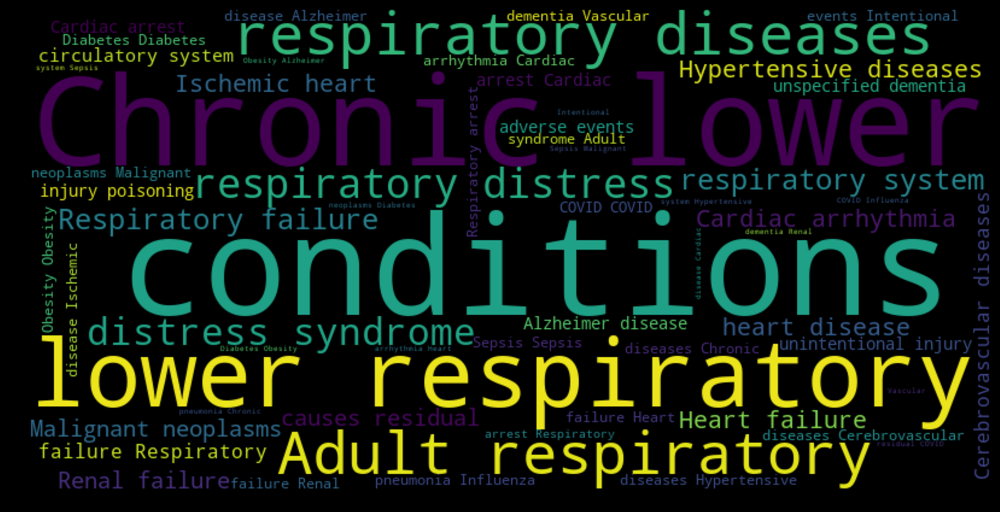

In [47]:
sentences = ' '.join(list(covid_death_data['Condition']))
wordcloud = WordCloud(width = 800, height = 400, background_color = 'black').generate(sentences)
plt.figure(figsize = (20,20), facecolor = 'k')
plt.imshow(wordcloud)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

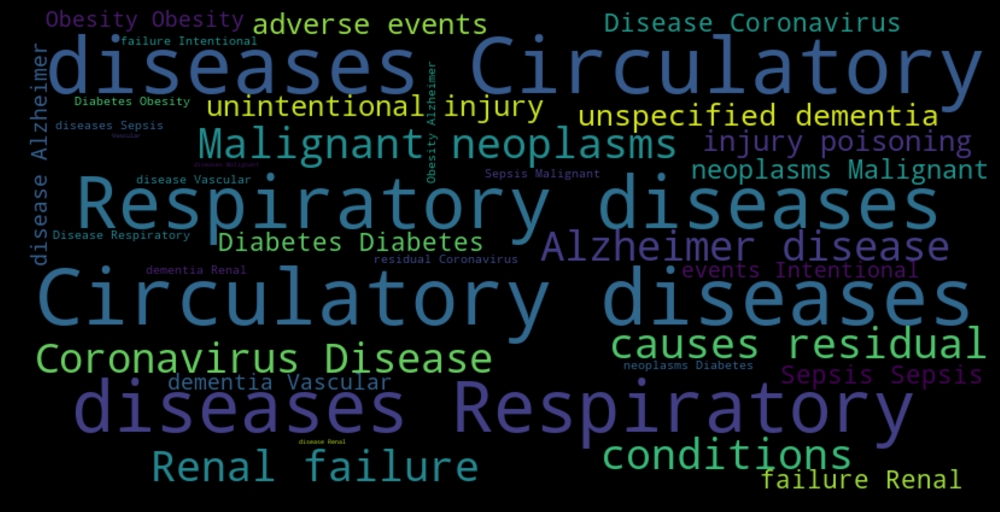

In [48]:
sentences = ' '.join(list(covid_death_data['Condition Group']))
wordcloud = WordCloud(width = 800, height = 400, background_color = 'black').generate(sentences)
plt.figure(figsize = (20,20), facecolor = 'k')
plt.imshow(wordcloud)
plt.show

In [49]:
# Using a Linear Regression model to predict the number of recovered cases of COVID-19 based on the number of confirmed cases.
X = covid_grouped_data['Confirmed'].values.reshape(-1,1)
y = covid_grouped_data['Recovered'].values.reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(f"Using Linear Regression, the mean squared score is {mean_squared_error(y_test, y_pred)}")

print(f"Using Linear Regression, the R-squared score is {r2_score(y_test, y_pred)}")

Using Linear Regression, the mean squared score is 737870108.1195656
Using Linear Regression, the R-squared score is 0.8178196095317453


In [50]:
# Compare the actual and predicted values
model_data = pd.DataFrame({'Actual': y_test.flatten().round(), 'Predicted': y_pred.flatten().round()})

px.scatter(model_data, x = 'Actual', y = 'Predicted', title = 'Actual vs Predicted Recovered Cases of COVID-19 using Polynomial Regression',
                  color = 'Predicted', size = 'Predicted', hover_data = ['Actual', 'Predicted'])

In [51]:
# Let's try using a Polynomial Regression model to predict the number of recovered cases of COVID-19 based on the number of confirmed cases.
poly = PolynomialFeatures(degree = 2)
X_poly = poly.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size = 0.2, random_state = 0)

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(f"Using Polynomial Regression, the mean squared score is {mean_squared_error(y_test, y_pred)}")

print(f"Using Polynomial Regression, the R-squared score is {r2_score(y_test, y_pred)}")


Using Polynomial Regression, the mean squared score is 563920779.8271073
Using Polynomial Regression, the R-squared score is 0.8607677601632593


In [52]:
# Compare the model predictions with the actual data.
model_data = pd.DataFrame({'Actual': y_test.flatten().round(), 'Predicted': y_pred.flatten().round()})

px.scatter(model_data, x = 'Actual', y = 'Predicted', title = 'Actual vs Predicted Recovered Cases of COVID-19 using Polynomial Regression',
                  color = 'Predicted', size = 'Predicted', hover_data = ['Actual', 'Predicted'])

In [53]:
# param_grid = {
#     'n_estimators': [100, 200, 300, 1000],
#     'max_depth': [10, 20, 30, 40, 50],
#     'max_features': ['auto', 'sqrt', 'log2']
# }

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# grid_search = GridSearchCV(estimator = RandomForestRegressor(), param_grid = param_grid, cv = 5, n_jobs = -1, verbose = 2)
# grid_search.fit(X_train, y_train)

# grid_search.best_params_

# model = RandomForestRegressor(n_estimators = 100, max_depth = 10, max_features = 'auto')

# model.fit(X_train, y_train)

# y_pred = model.predict(X_test)

# print(f"Using Random Forest Regressor, the mean squared score is {mean_squared_error(y_test, y_pred)}")

# print(f"Using Random Forest Regressor, the R-squared score is {r2_score(y_test, y_pred)}")



In [54]:
# Using a Linear Regression model to predict the number of deaths due to COVID-19 based on the number of confirmed cases.
X = covid_grouped_data['Confirmed'].values.reshape(-1,1)
y = covid_grouped_data['Deaths'].values.reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(f"Using Linear Regression, the mean squared score is {mean_squared_error(y_test, y_pred)}")

print(f"Using Linear Regression, the R-squared score is {r2_score(y_test, y_pred)}")

Using Linear Regression, the mean squared score is 8162509.004451307
Using Linear Regression, the R-squared score is 0.8240265434838608


In [55]:
model_data = pd.DataFrame({'Actual': y_test.flatten().round(), 'Predicted': y_pred.flatten().round()})

px.scatter(model_data, x = 'Actual', y = 'Predicted', title = 'Actual vs Predicted Deaths of COVID-19 using Linear Regression',
                  color = 'Predicted', size = 'Predicted', hover_data = ['Actual', 'Predicted'])

In [56]:
poly = PolynomialFeatures(degree = 2)
X_poly = poly.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size = 0.2, random_state = 0)

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(f"Using Polynomial Regression, the mean squared score is {mean_squared_error(y_test, y_pred)}")

print(f"Using Polynomial Regression, the R-squared score is {r2_score(y_test, y_pred)}")

Using Polynomial Regression, the mean squared score is 7608127.345001347
Using Polynomial Regression, the R-squared score is 0.8359783167424706


In [57]:
model_data = pd.DataFrame({'Actual': y_test.flatten().round(), 'Predicted': y_pred.flatten().round()})

px.scatter(model_data, x = 'Actual', y = 'Predicted', title = 'Actual vs Predicted Deaths of COVID-19 using Polynomial Regression',
                  color = 'Predicted', size = model_data['Predicted'].abs(), hover_data = ['Actual', 'Predicted'])